# Importing MNIST

In [63]:
# Common imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
])
mnist = datasets.MNIST(root="./data", train=True, transform=transform, download=True)
dataloader = DataLoader(mnist, batch_size=128, shuffle=True)

# Utility to show generated images
def show_generated_images(images, title="Generated Images"):
    grid = vutils.make_grid(images[:64], nrow=8, normalize=True)
    npimg = grid.cpu().numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimg, (1,2,0)))
    plt.title(title)
    plt.axis("off")
    plt.show()


100%|███████████████████████████████████████| 9.91M/9.91M [00:25<00:00, 396kB/s]
100%|██████████████████████████████████████| 28.9k/28.9k [00:00<00:00, 87.8kB/s]
100%|███████████████████████████████████████| 1.65M/1.65M [00:06<00:00, 271kB/s]
100%|██████████████████████████████████████| 4.54k/4.54k [00:00<00:00, 3.44MB/s]


In [73]:
def plot_real_vs_generated(real, fake, title="Real vs Generated"):
    real = real[:8].cpu()
    fake = fake[:8].cpu()
    
    fig, axes = plt.subplots(2, 8, figsize=(16, 4))
    for i in range(8):
        axes[0, i].imshow(real[i].squeeze(), cmap="gray")
        axes[0, i].axis("off")
        axes[1, i].imshow(fake[i].squeeze(), cmap="gray")
        axes[1, i].axis("off")
    axes[0, 0].set_title("Real", loc="left", fontsize=12)
    axes[1, 0].set_title("Generated", loc="left", fontsize=12)
    fig.suptitle(title)
    plt.show()


# GAN

In [65]:
# Generator (MLP)
class GAN_Generator(nn.Module):
    def __init__(self, z_dim=100):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256), nn.ReLU(),
            nn.Linear(256, 512), nn.ReLU(),
            nn.Linear(512, 784), nn.Tanh()
        )

    def forward(self, z):
        out = self.net(z)
        return out.view(-1, 1, 28, 28)

# Discriminator (MLP)
class GAN_Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 512), nn.LeakyReLU(0.2),
            nn.Linear(512, 256), nn.LeakyReLU(0.2),
            nn.Linear(256, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)


[Epoch 1] Loss_D: 0.0614  Loss_G: 5.3898


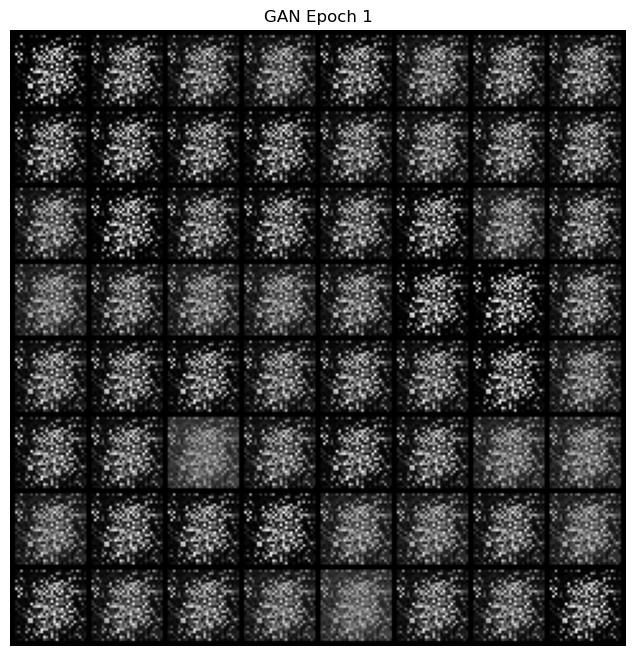

[Epoch 2] Loss_D: 0.4121  Loss_G: 4.0851


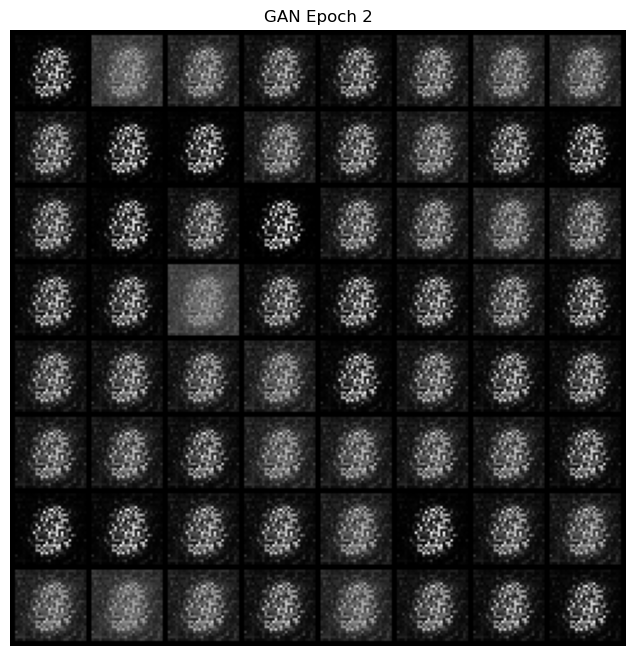

[Epoch 3] Loss_D: 1.9018  Loss_G: 1.6858


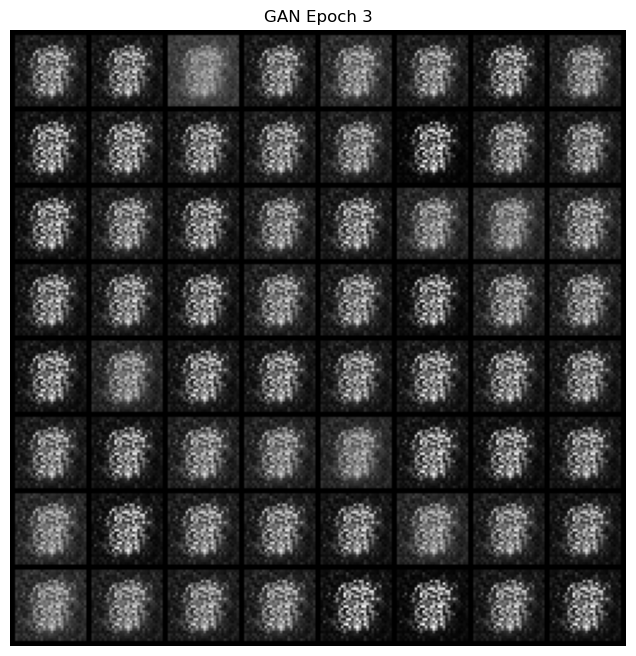

[Epoch 4] Loss_D: 0.5479  Loss_G: 2.9852


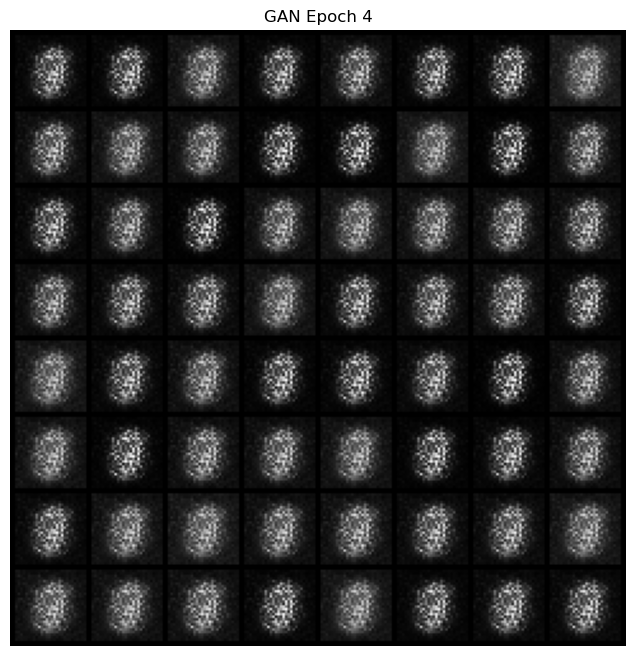

[Epoch 5] Loss_D: 0.4265  Loss_G: 2.8414


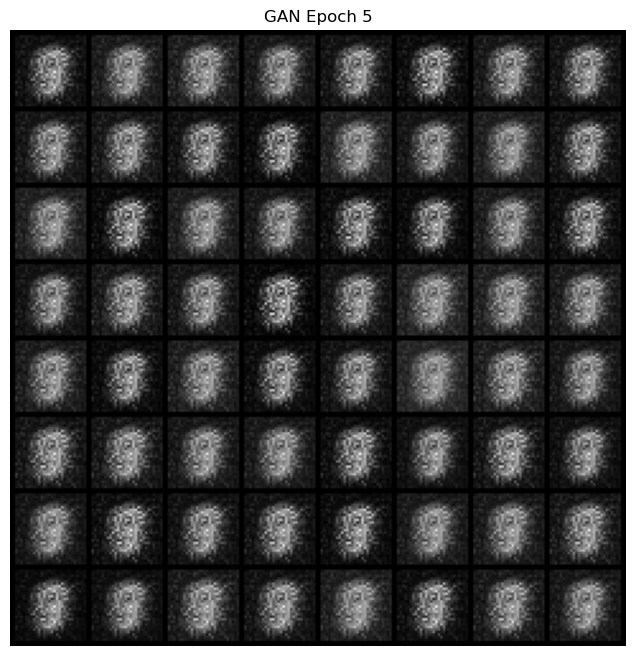

[Epoch 6] Loss_D: 0.3253  Loss_G: 3.7375


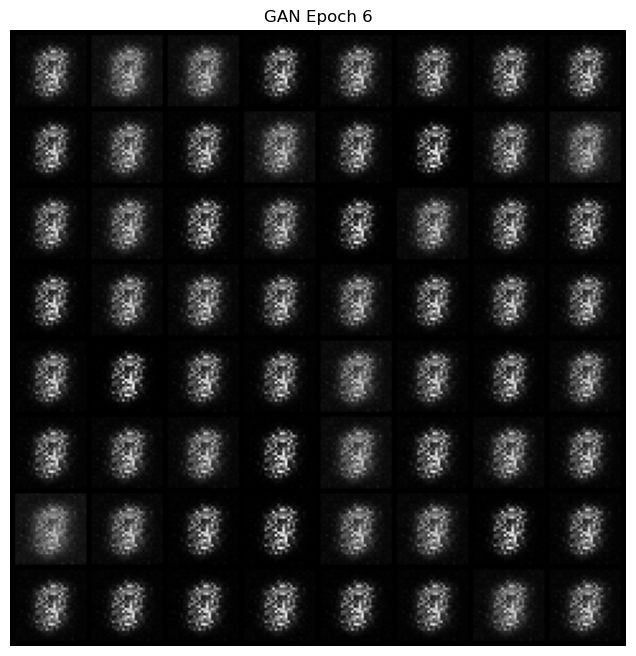

[Epoch 7] Loss_D: 0.5047  Loss_G: 2.3183


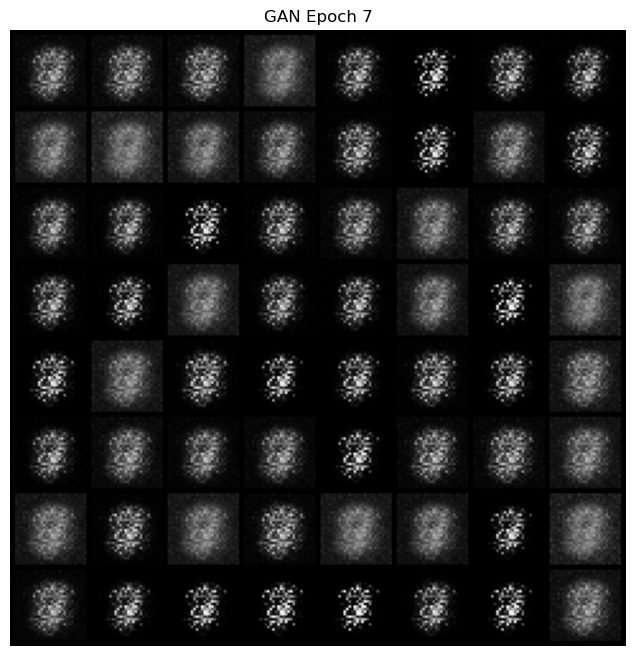

[Epoch 8] Loss_D: 0.5227  Loss_G: 4.4823


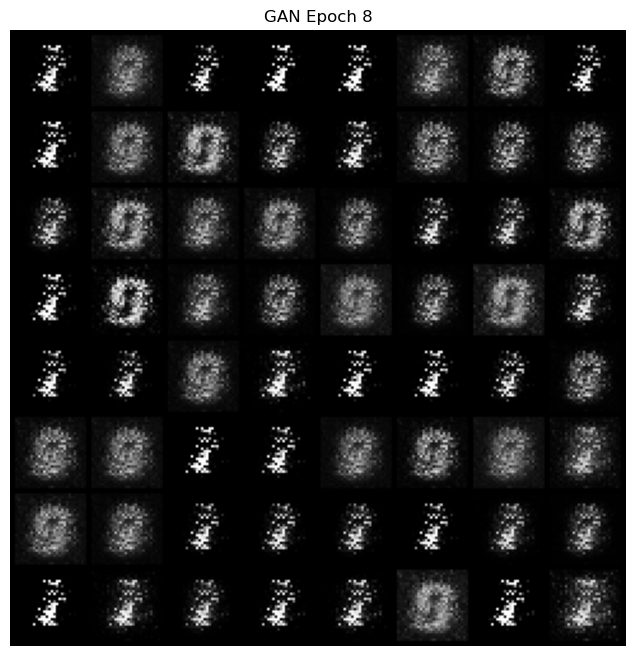

[Epoch 9] Loss_D: 0.2609  Loss_G: 3.8529


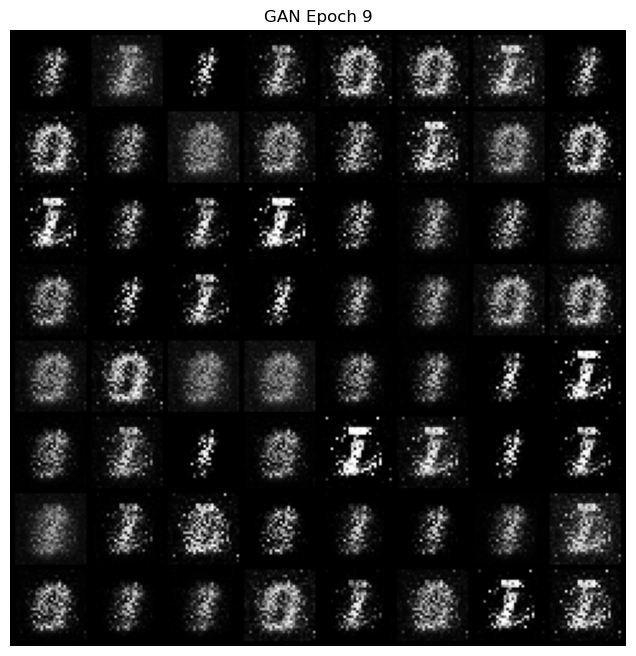

[Epoch 10] Loss_D: 0.1752  Loss_G: 5.5256


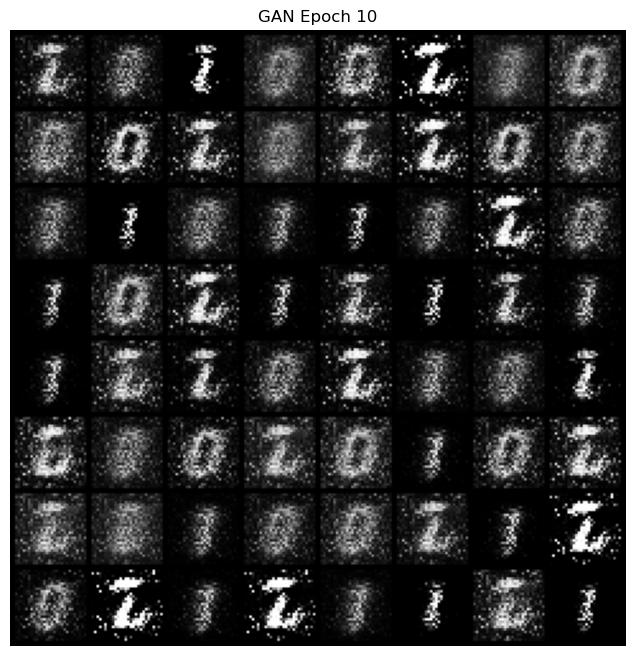

[Epoch 11] Loss_D: 0.1304  Loss_G: 7.1250


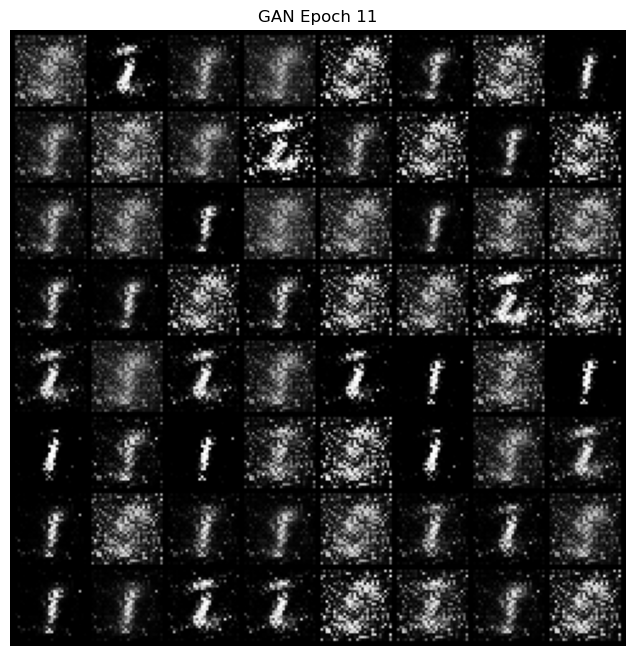

[Epoch 12] Loss_D: 0.0688  Loss_G: 6.9565


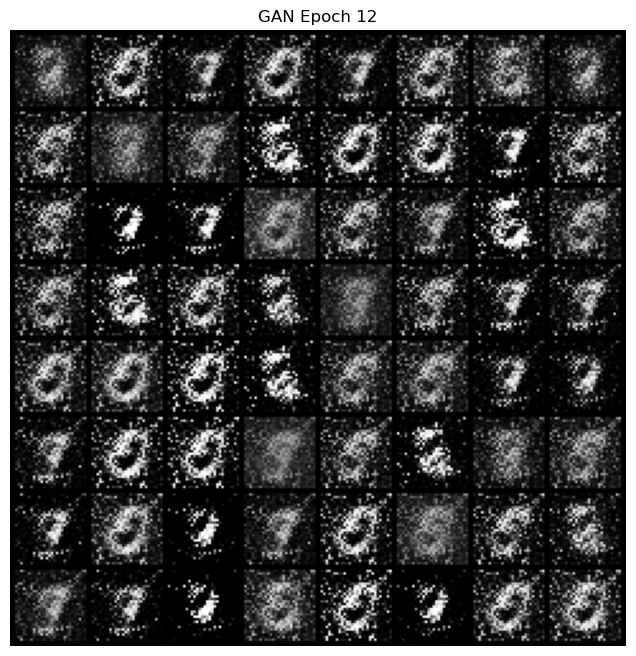

[Epoch 13] Loss_D: 0.2379  Loss_G: 6.4045


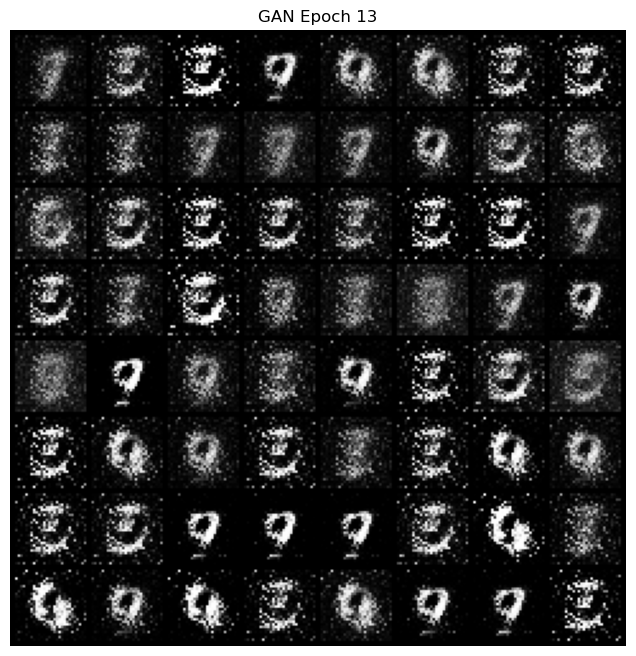

[Epoch 14] Loss_D: 0.0945  Loss_G: 6.7040


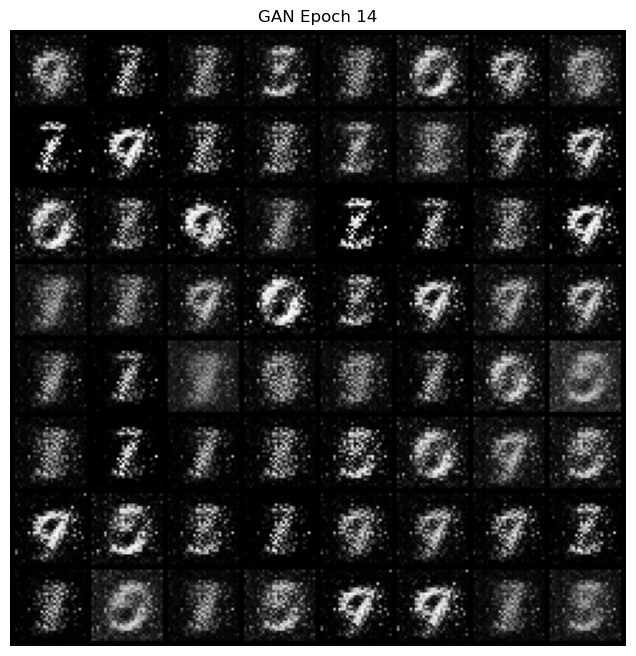

[Epoch 15] Loss_D: 0.3946  Loss_G: 4.9037


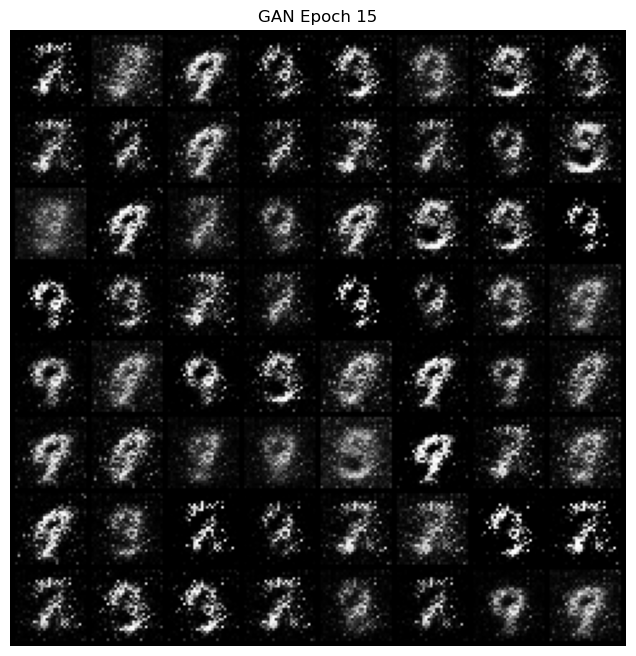

[Epoch 16] Loss_D: 0.6276  Loss_G: 3.8527


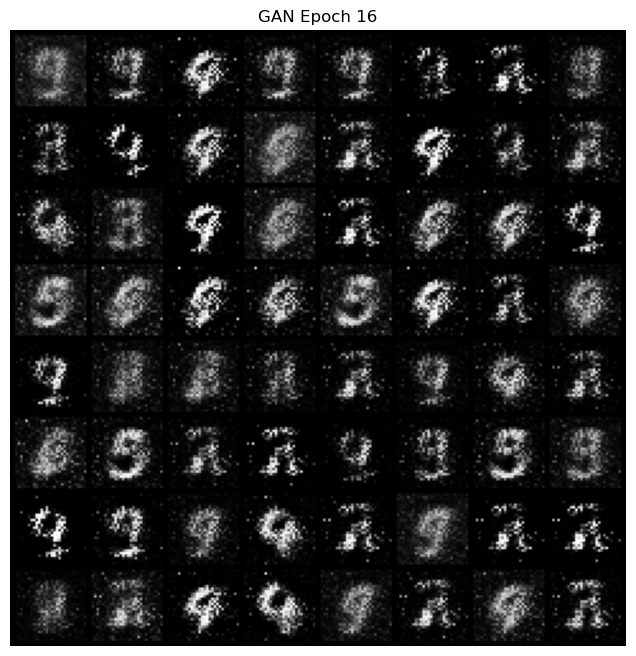

[Epoch 17] Loss_D: 0.0674  Loss_G: 5.2751


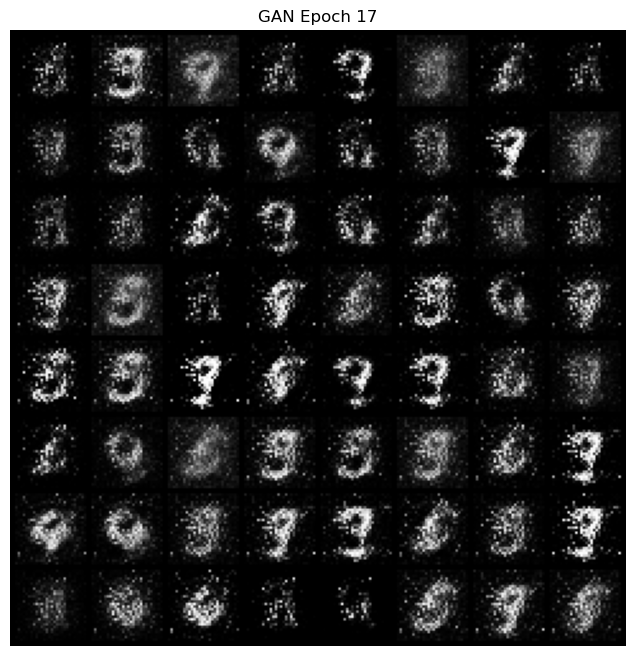

[Epoch 18] Loss_D: 0.3592  Loss_G: 5.2137


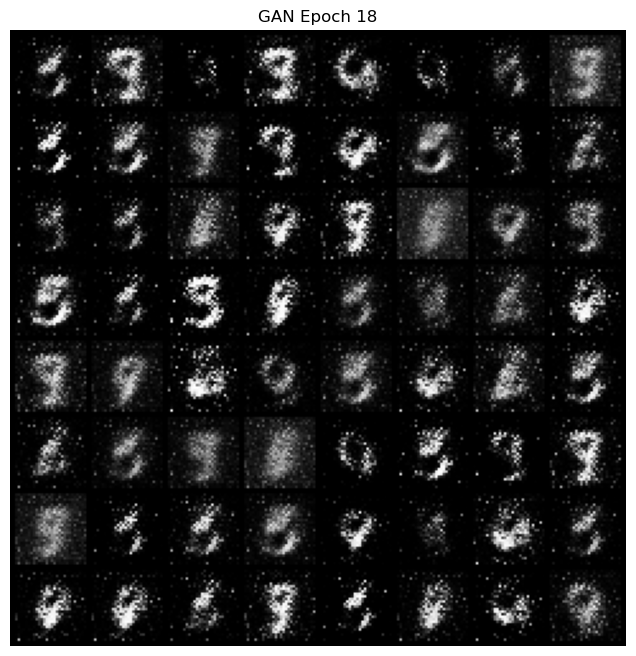

[Epoch 19] Loss_D: 0.4705  Loss_G: 6.2603


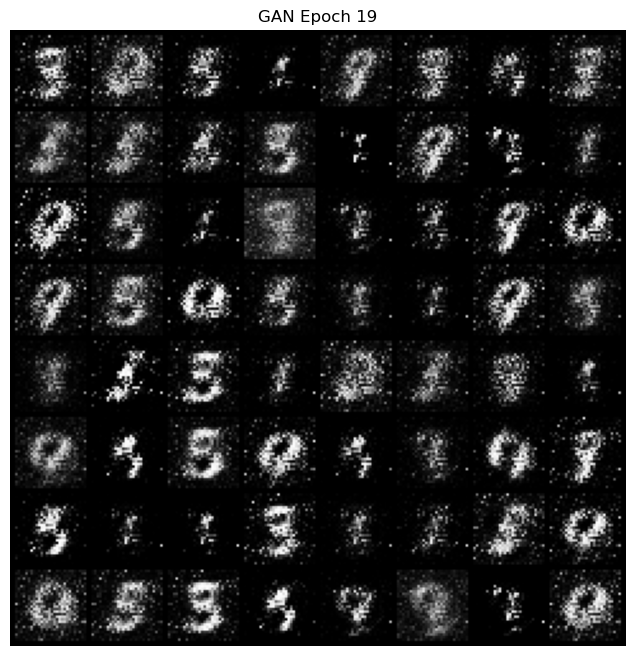

[Epoch 20] Loss_D: 0.1253  Loss_G: 4.6517


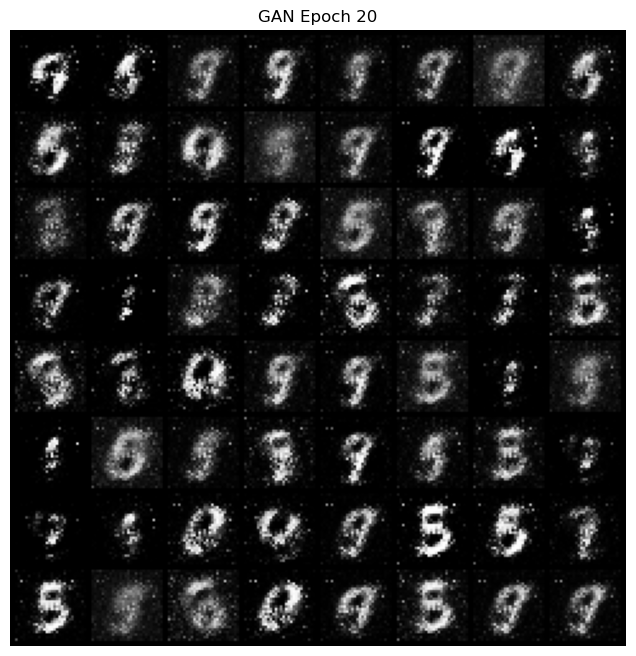

In [67]:
# Initialize GAN
G = GAN_Generator().to(device)
D = GAN_Discriminator().to(device)
loss_fn = nn.BCELoss()
z_dim = 100
opt_G = optim.Adam(G.parameters(), lr=0.0002)
opt_D = optim.Adam(D.parameters(), lr=0.0002)

# Training loop
for epoch in range(20):
    for real, _ in dataloader:
        real = real.to(device)
        batch_size = real.size(0)
        noise = torch.randn(batch_size, z_dim, device=device)
        fake = G(noise)

        # Discriminator update
        D_real = D(real)
        D_fake = D(fake.detach())
        loss_D = loss_fn(D_real, torch.ones_like(D_real)) + \
                 loss_fn(D_fake, torch.zeros_like(D_fake))
        opt_D.zero_grad()
        loss_D.backward()
        opt_D.step()

        # Generator update
        fake = G(noise)
        D_fake = D(fake)
        loss_G = loss_fn(D_fake, torch.ones_like(D_fake))
        opt_G.zero_grad()
        loss_G.backward()
        opt_G.step()

    print(f"[Epoch {epoch+1}] Loss_D: {loss_D.item():.4f}  Loss_G: {loss_G.item():.4f}")
    with torch.no_grad():
        fake_imgs = G(torch.randn(64, z_dim, device=device))
        show_generated_images(fake_imgs, title=f"GAN Epoch {epoch+1}")


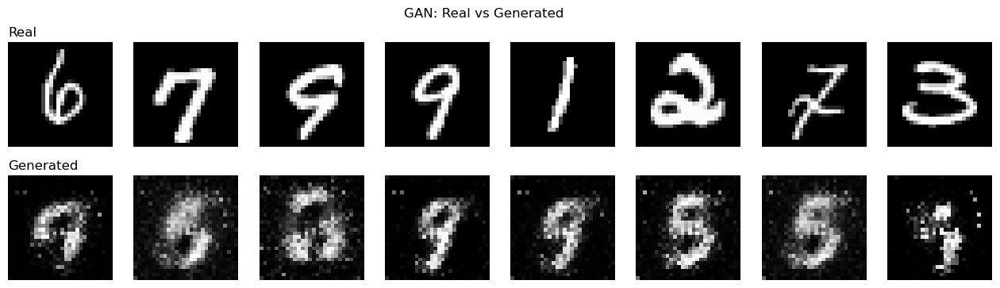

In [75]:
# Plot after training
with torch.no_grad():
    noise = torch.randn(8, z_dim, device=device)
    fake_imgs = G(noise)
    real_imgs = next(iter(dataloader))[0].to(device)
    plot_real_vs_generated(real_imgs, fake_imgs, title="GAN: Real vs Generated")


# DCGAN

In [77]:
# DCGAN Generator
class DCGAN_Generator(nn.Module):
    def __init__(self, z_dim=100):
        super().__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 128, 7, 1, 0, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(True),
            nn.ConvTranspose2d(64, 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.net(z)

# DCGAN Discriminator
class DCGAN_Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 64, 4, 2, 1), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1), nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)


[Epoch 1] Loss_D: 0.5632  Loss_G: 1.7765


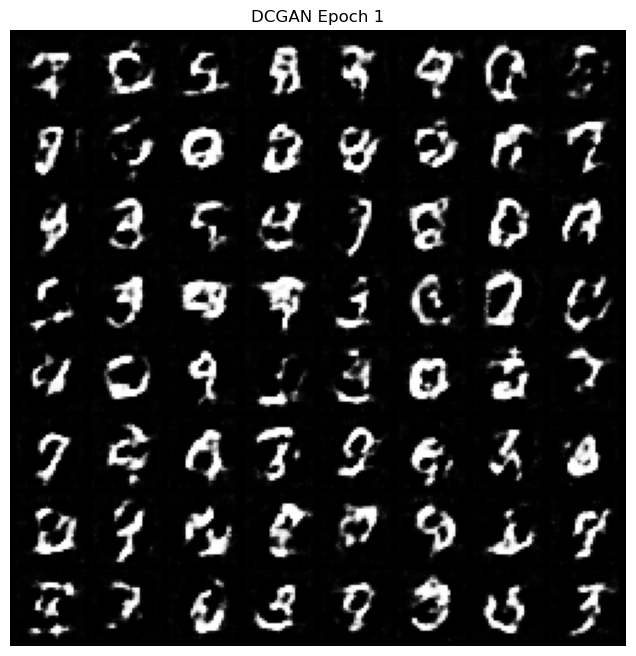

[Epoch 2] Loss_D: 0.6070  Loss_G: 1.5886


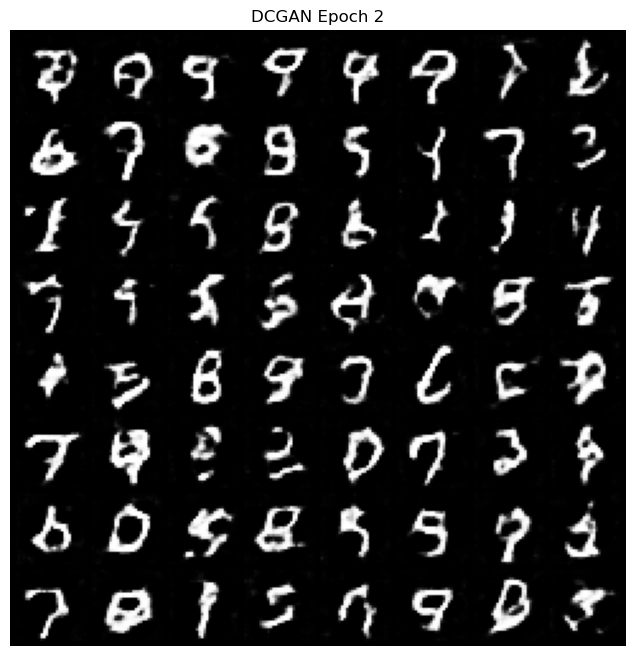

[Epoch 3] Loss_D: 0.4582  Loss_G: 1.4386


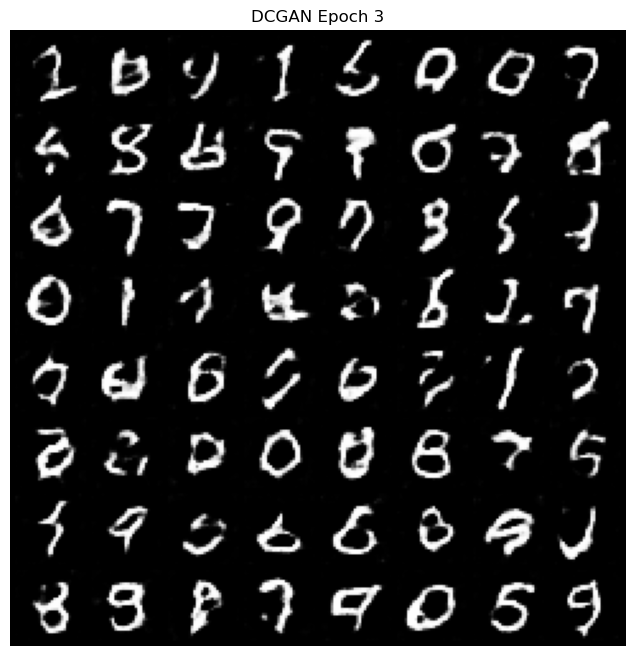

[Epoch 4] Loss_D: 0.6609  Loss_G: 2.5926


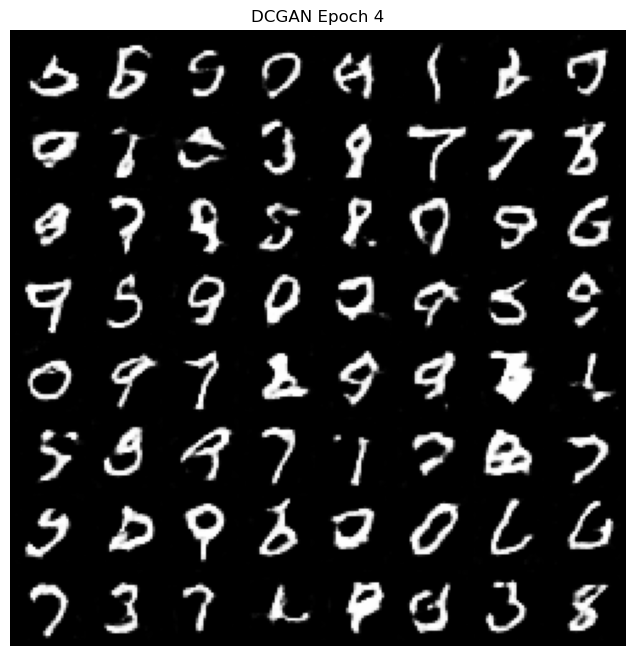

[Epoch 5] Loss_D: 0.6853  Loss_G: 1.2674


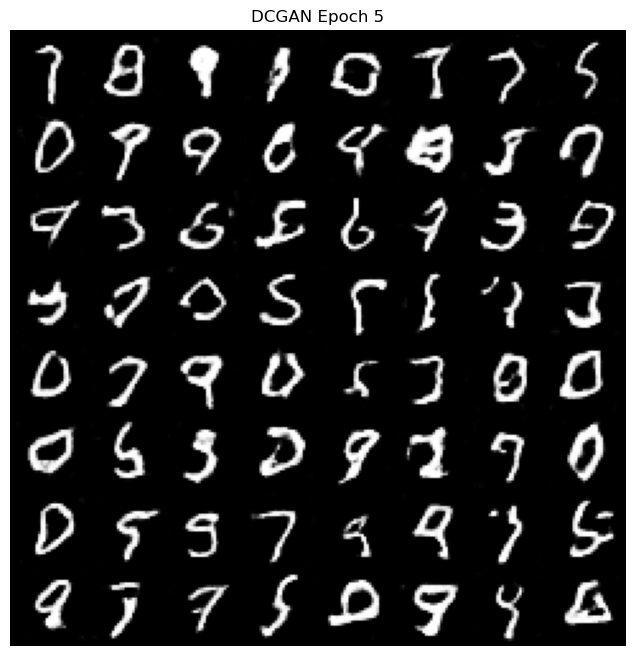

[Epoch 6] Loss_D: 0.5725  Loss_G: 1.5374


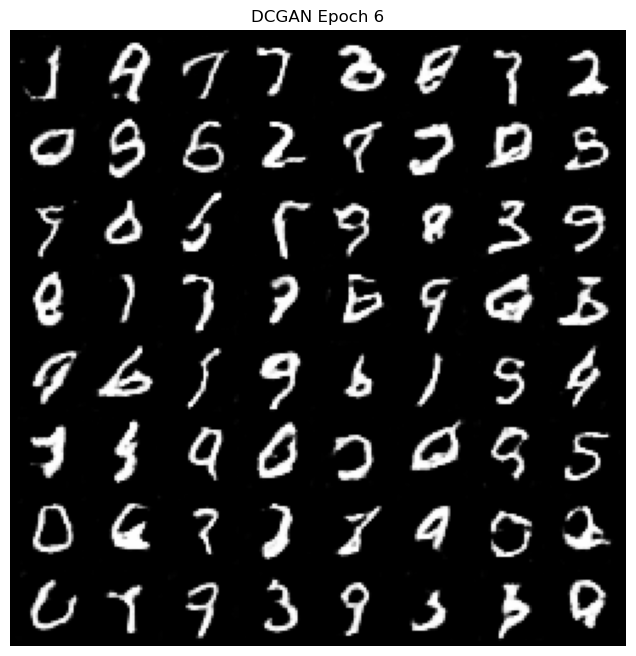

[Epoch 7] Loss_D: 0.6324  Loss_G: 1.1884


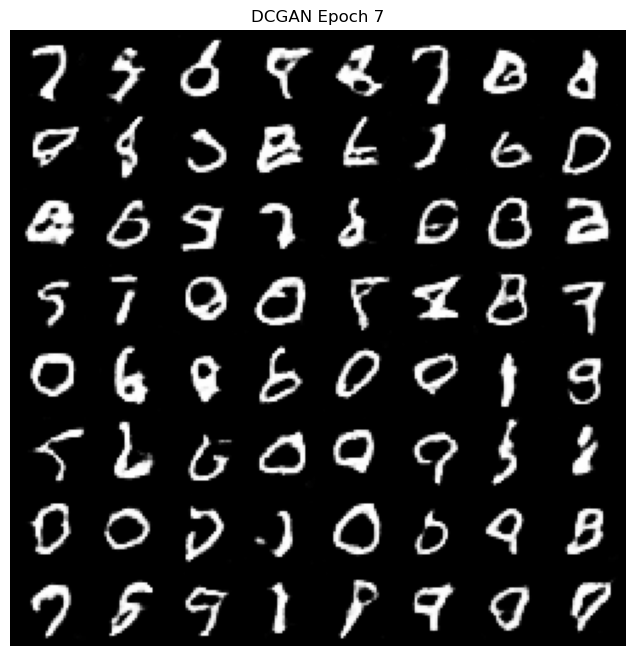

[Epoch 8] Loss_D: 0.5492  Loss_G: 2.3556


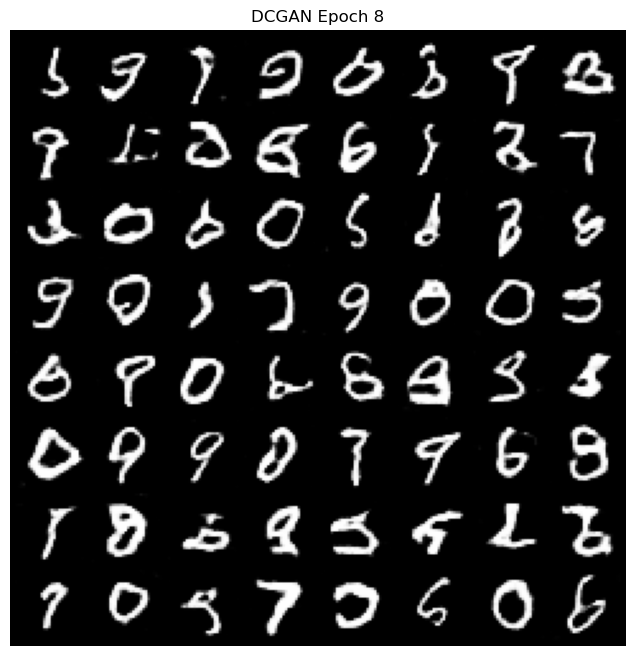

[Epoch 9] Loss_D: 0.7392  Loss_G: 1.6126


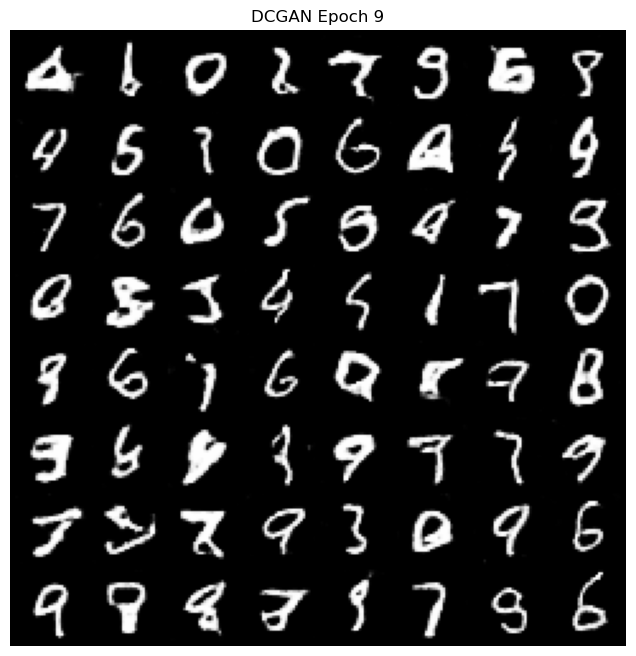

[Epoch 10] Loss_D: 0.5955  Loss_G: 1.6516


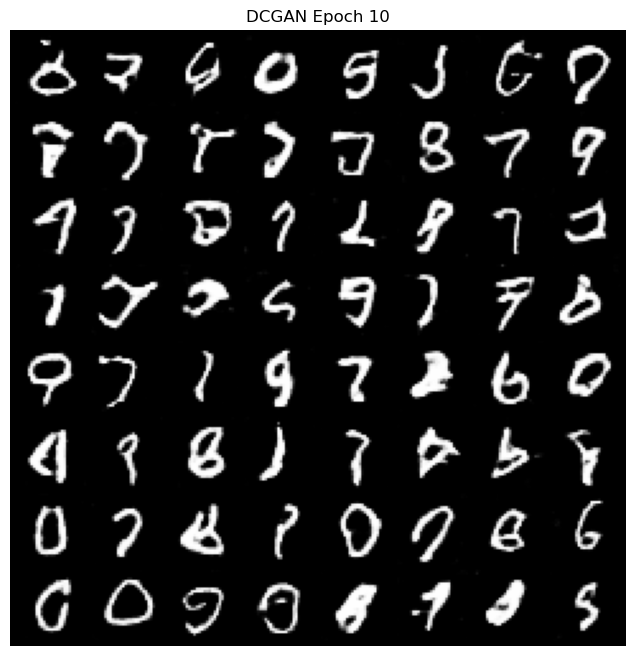

[Epoch 11] Loss_D: 0.6516  Loss_G: 1.1846


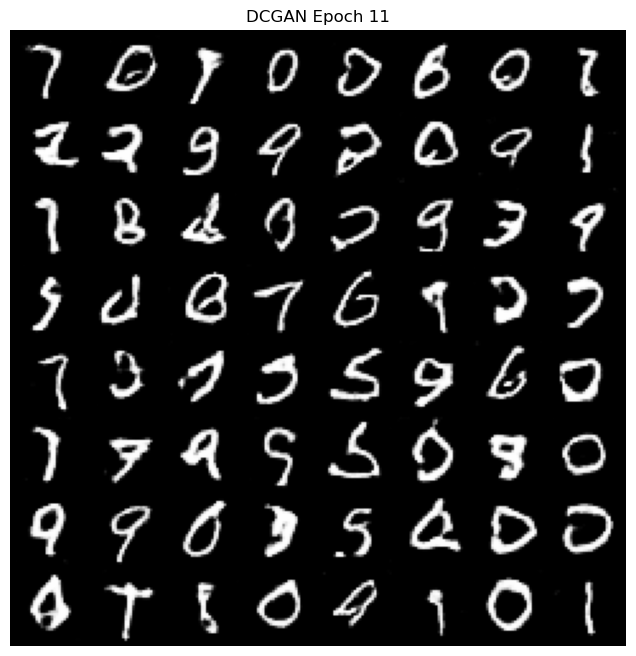

[Epoch 12] Loss_D: 0.4677  Loss_G: 2.2490


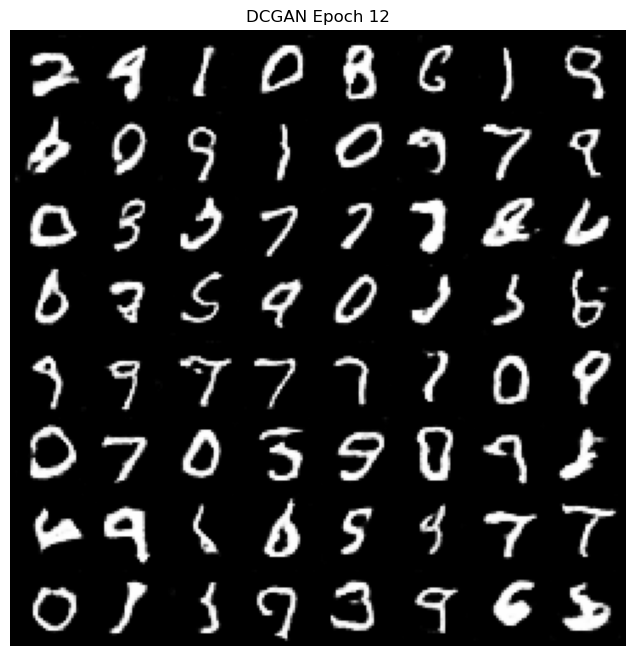

[Epoch 13] Loss_D: 0.5050  Loss_G: 2.8312


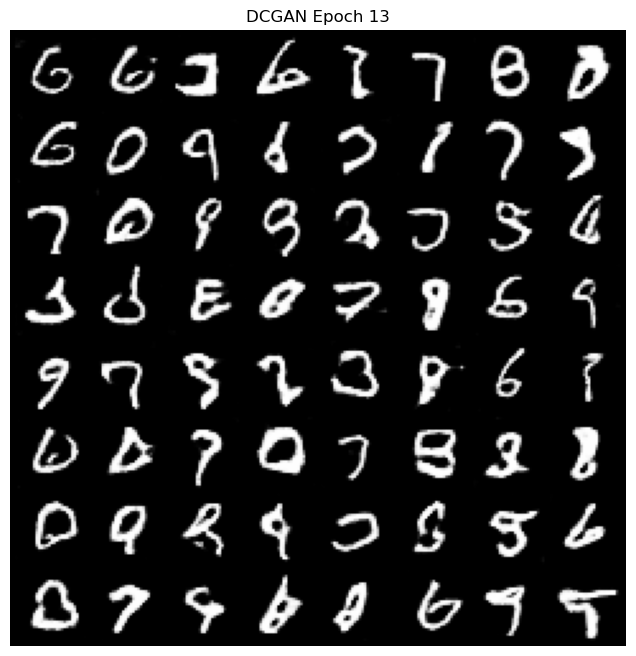

[Epoch 14] Loss_D: 0.6545  Loss_G: 2.2334


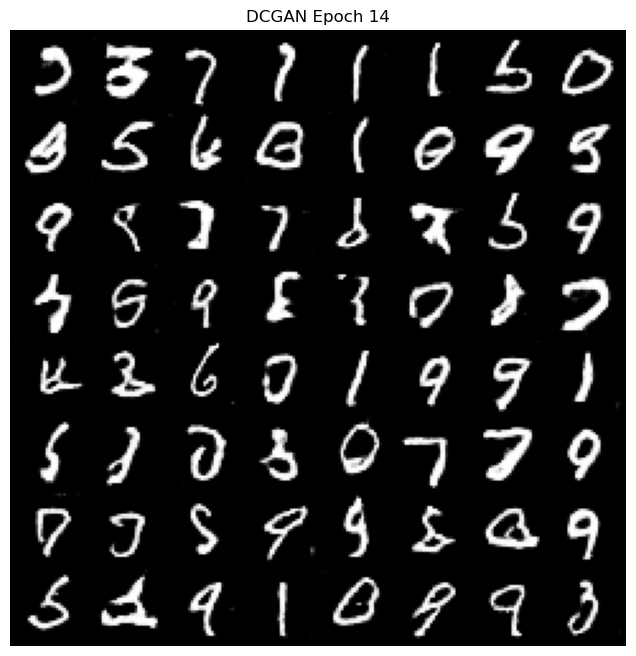

[Epoch 15] Loss_D: 0.6348  Loss_G: 1.3979


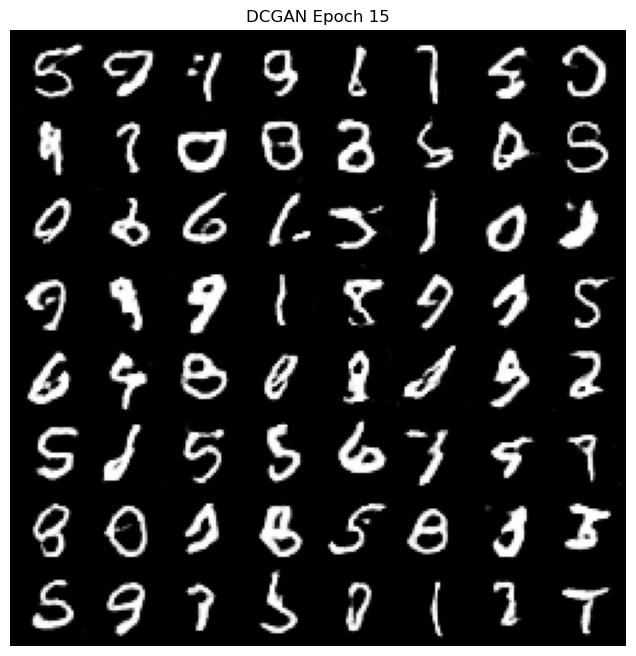

[Epoch 16] Loss_D: 0.6877  Loss_G: 1.8259


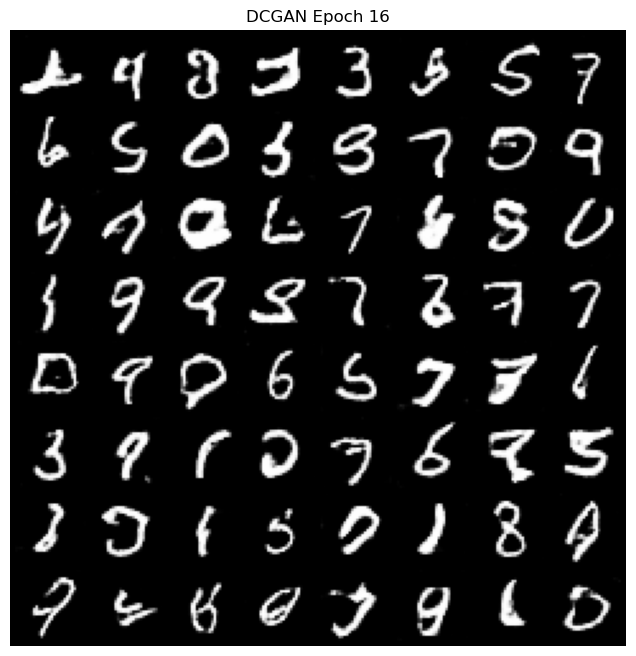

[Epoch 17] Loss_D: 0.5106  Loss_G: 1.9240


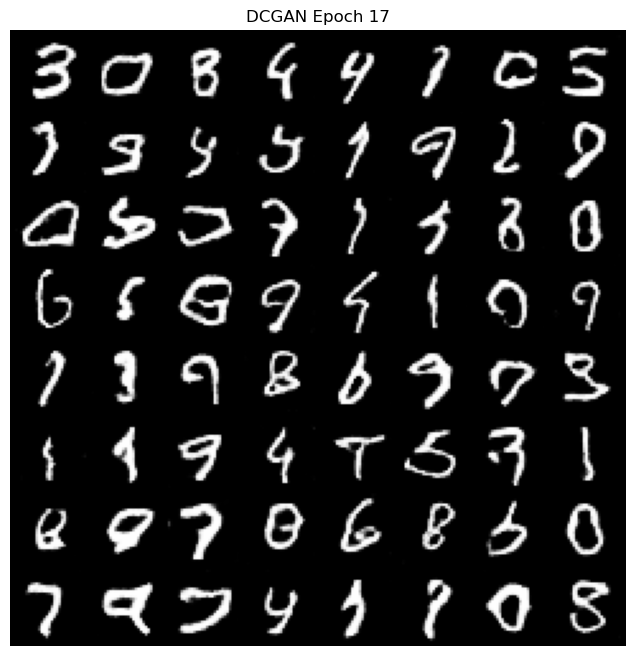

[Epoch 18] Loss_D: 0.6411  Loss_G: 3.1831


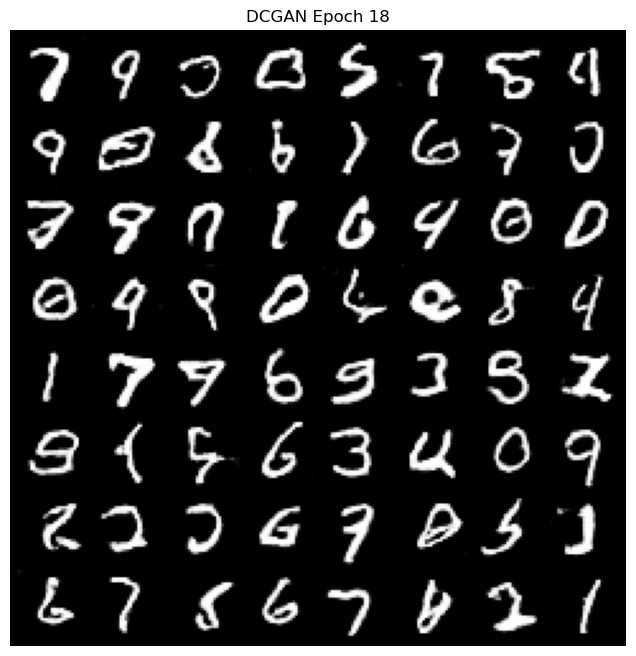

[Epoch 19] Loss_D: 0.6694  Loss_G: 1.6120


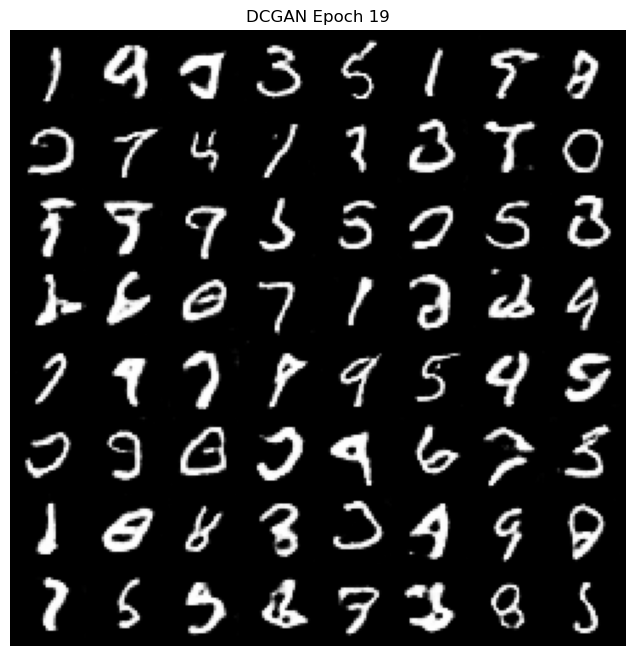

[Epoch 20] Loss_D: 0.5420  Loss_G: 1.8279


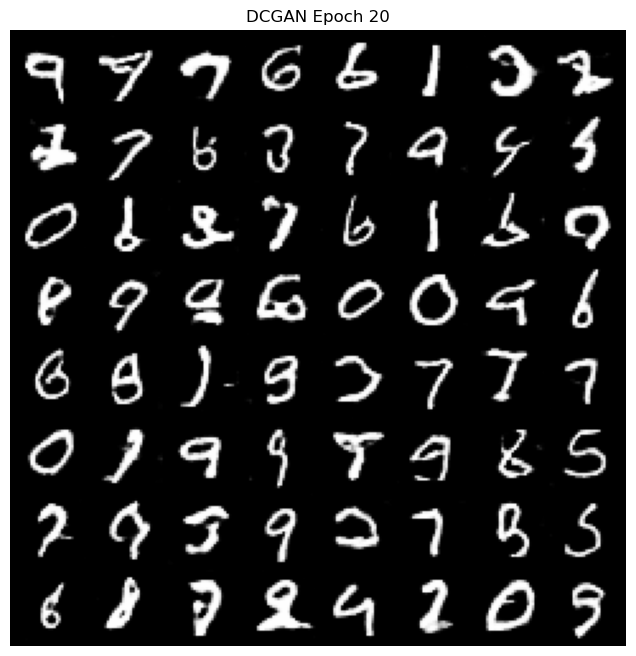

In [84]:
from tqdm import tqdm  # <-- Add this import if not already

# Initialize DCGAN
z_dim = 100
G = DCGAN_Generator(z_dim).to(device)
D = DCGAN_Discriminator().to(device)
opt_G = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
opt_D = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
loss_fn = nn.BCELoss()

# Training loop with progress bar
for epoch in range(20):
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}", leave=False)
    for real, _ in progress_bar:
        real = real.to(device)
        batch_size = real.size(0)
        noise = torch.randn(batch_size, z_dim, 1, 1, device=device)
        fake = G(noise)

        # Train Discriminator
        D_real = D(real)
        D_fake = D(fake.detach())
        loss_D = loss_fn(D_real, torch.ones_like(D_real)) + \
                 loss_fn(D_fake, torch.zeros_like(D_fake))
        opt_D.zero_grad()
        loss_D.backward()
        opt_D.step()

        # Train Generator
        fake = G(noise)
        D_fake = D(fake)
        loss_G = loss_fn(D_fake, torch.ones_like(D_fake))
        opt_G.zero_grad()
        loss_G.backward()
        opt_G.step()

        progress_bar.set_postfix({
            "Loss_D": f"{loss_D.item():.4f}",
            "Loss_G": f"{loss_G.item():.4f}"
        })

    print(f"[Epoch {epoch+1}] Loss_D: {loss_D.item():.4f}  Loss_G: {loss_G.item():.4f}")
    with torch.no_grad():
        fake_imgs = G(torch.randn(64, z_dim, 1, 1, device=device))
        show_generated_images(fake_imgs, title=f"DCGAN Epoch {epoch+1}")


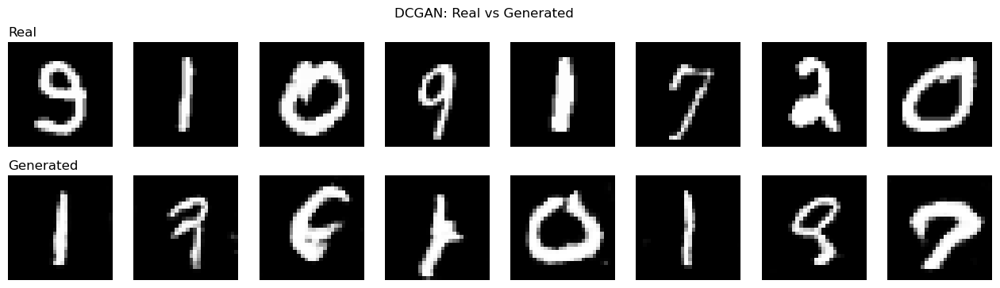

In [85]:
# Plot after training
with torch.no_grad():
    noise = torch.randn(8, z_dim, 1, 1, device=device)
    fake_imgs = G(noise)
    real_imgs = next(iter(dataloader))[0].to(device)
    plot_real_vs_generated(real_imgs, fake_imgs, title="DCGAN: Real vs Generated")


# WGAN

In [86]:
# WGAN Discriminator (Critic)
class WGAN_Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 512), nn.LeakyReLU(0.2),
            nn.Linear(512, 1)
        )

    def forward(self, x):
        return self.net(x)

# WGAN Generator (same as MLP GAN)
class WGAN_Generator(nn.Module):
    def __init__(self, z_dim=100):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256), nn.ReLU(),
            nn.Linear(256, 512), nn.ReLU(),
            nn.Linear(512, 784), nn.Tanh()
        )

    def forward(self, z):
        out = self.net(z)
        return out.view(-1, 1, 28, 28)


[Epoch 1] Loss_D: -0.2441  Loss_G: -0.7563


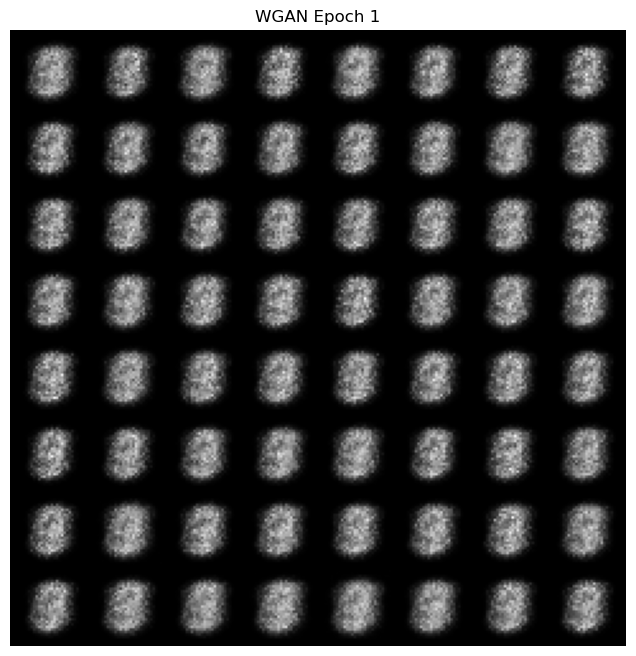

[Epoch 2] Loss_D: -0.2671  Loss_G: -1.8573


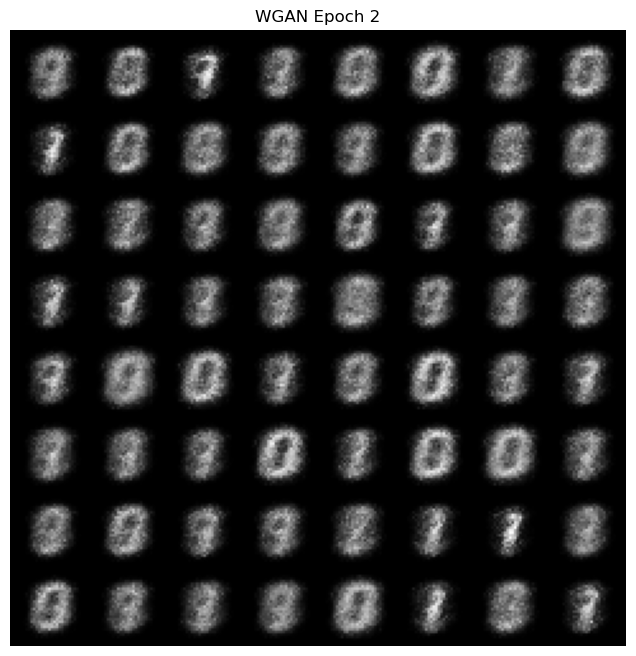

[Epoch 3] Loss_D: -0.3694  Loss_G: -1.4993


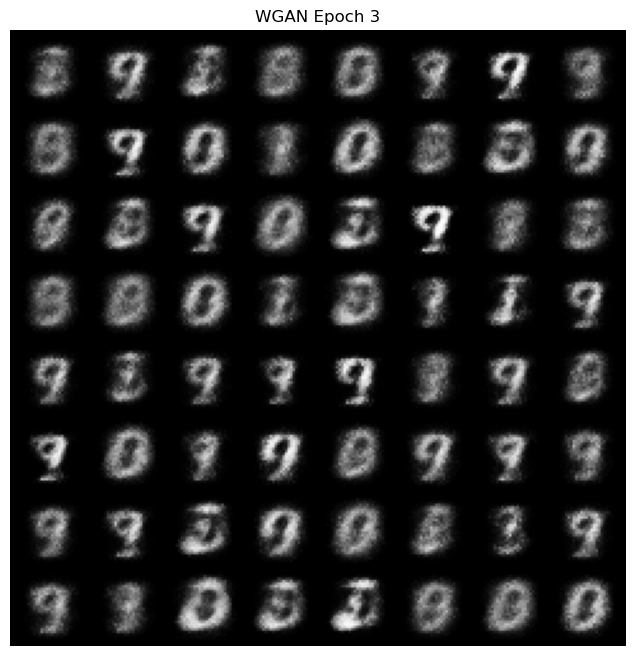

[Epoch 4] Loss_D: -0.1977  Loss_G: -1.2454


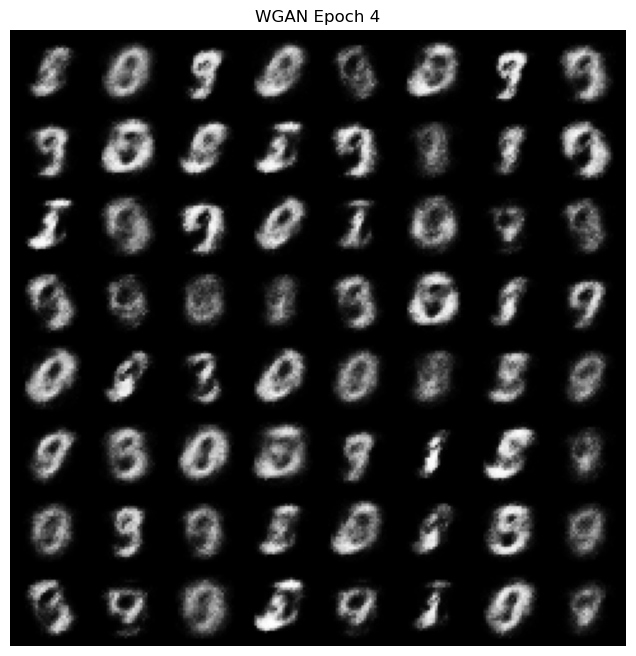

[Epoch 5] Loss_D: -0.2543  Loss_G: -0.9640


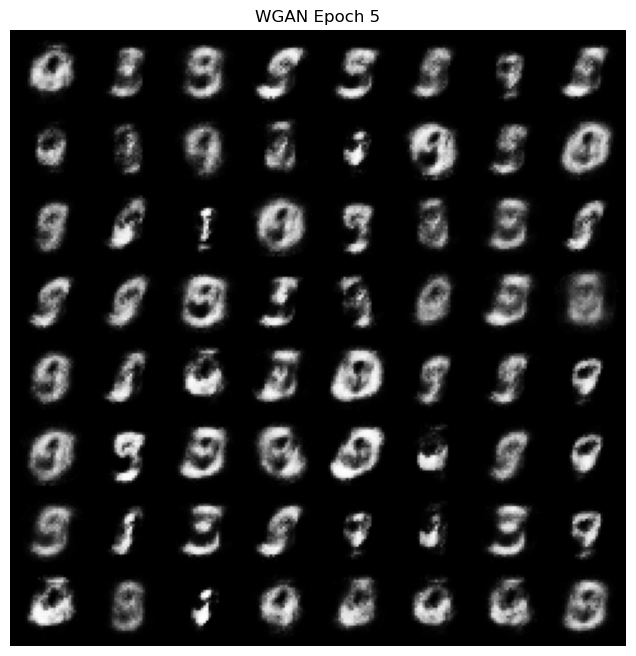

[Epoch 6] Loss_D: -0.2484  Loss_G: -0.6022


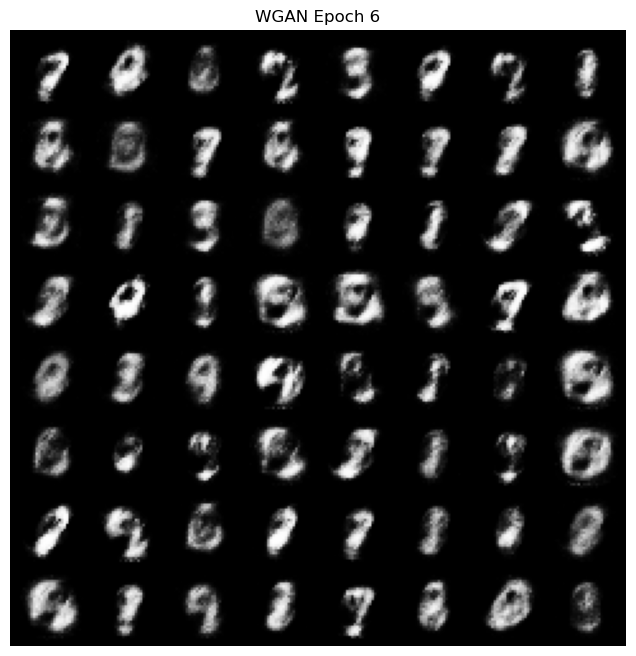

[Epoch 7] Loss_D: -0.2555  Loss_G: -0.5214


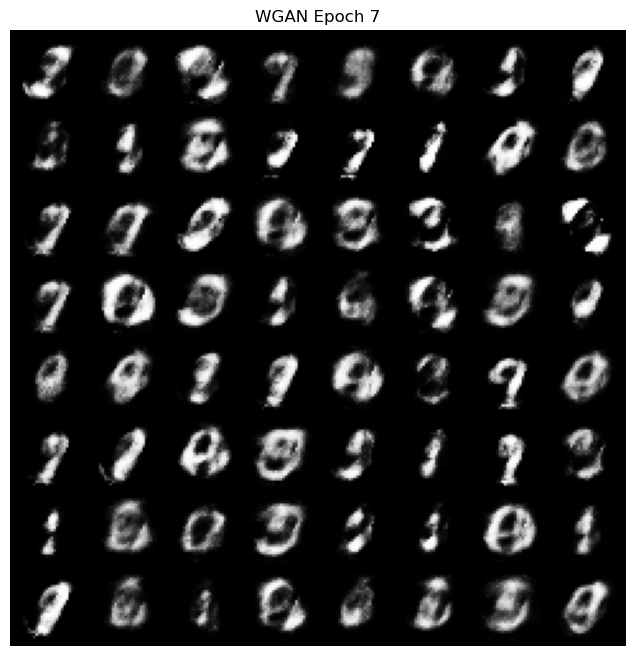

[Epoch 8] Loss_D: -0.1852  Loss_G: -0.3313


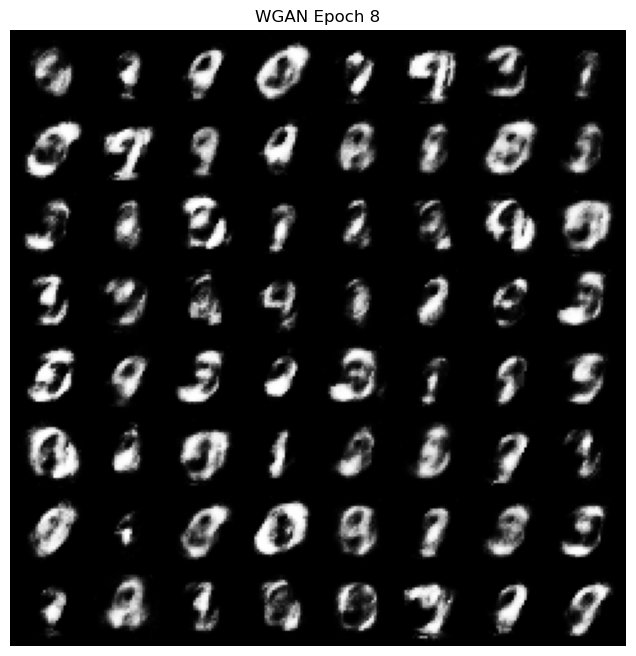

[Epoch 9] Loss_D: -0.2135  Loss_G: -0.3091


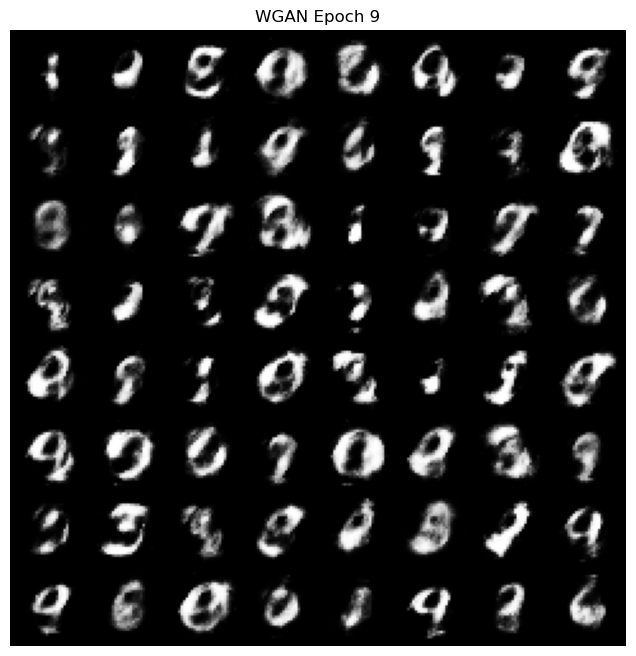

[Epoch 10] Loss_D: -0.2071  Loss_G: -0.1782


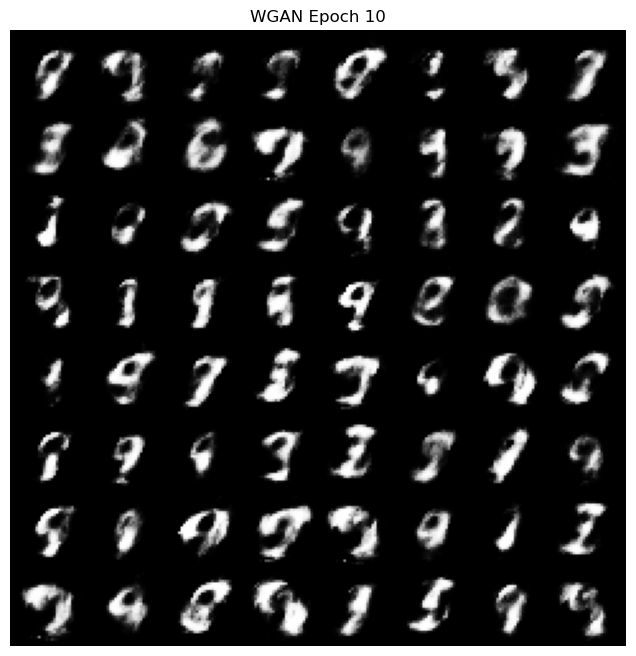

[Epoch 11] Loss_D: -0.1967  Loss_G: -0.1177


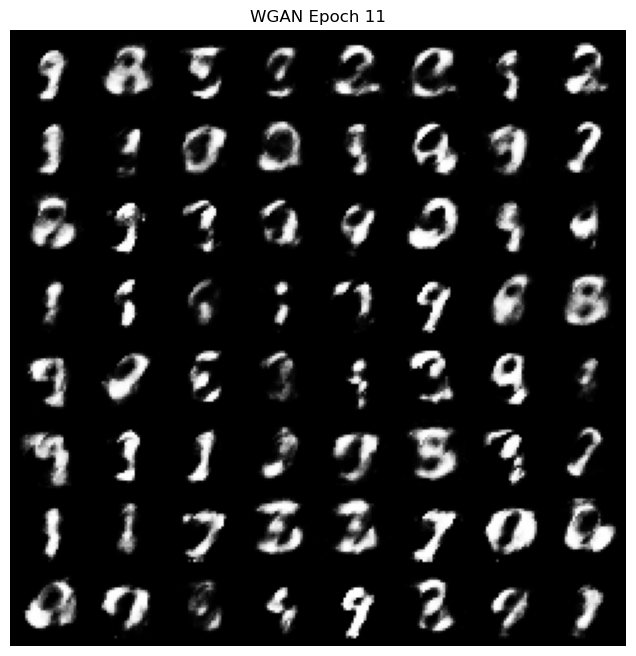

[Epoch 12] Loss_D: -0.1947  Loss_G: -0.0232


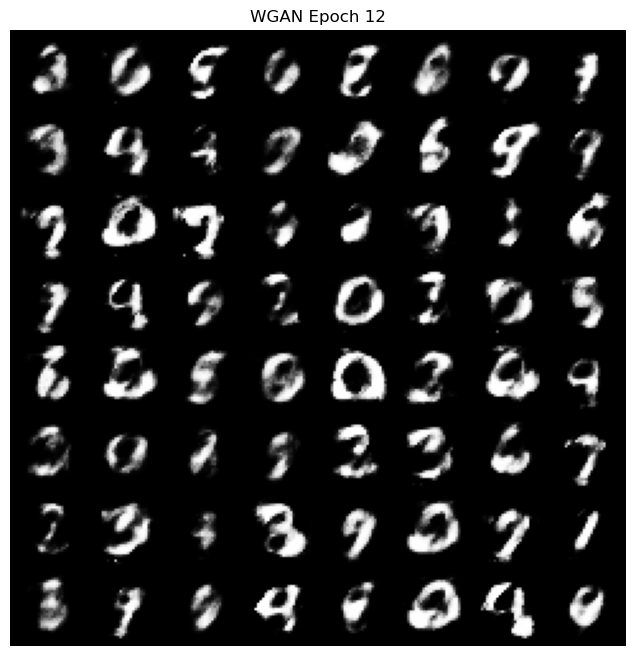

[Epoch 13] Loss_D: -0.2022  Loss_G: -0.0209


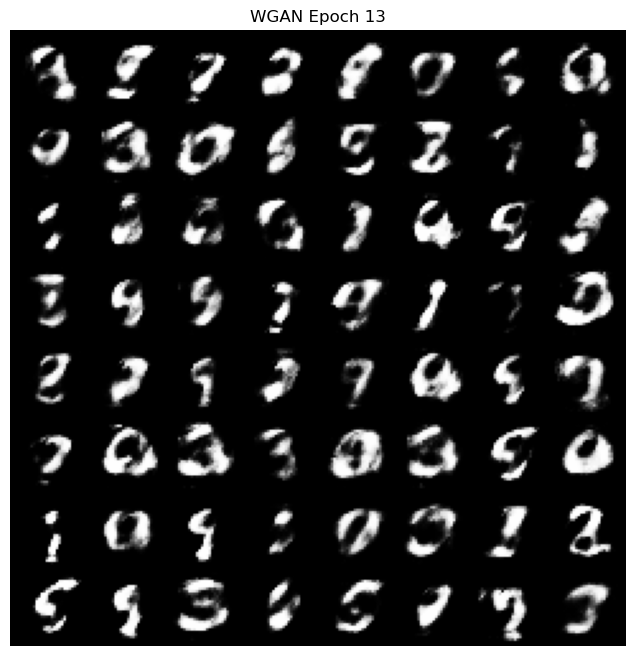

[Epoch 14] Loss_D: -0.1939  Loss_G: -0.0700


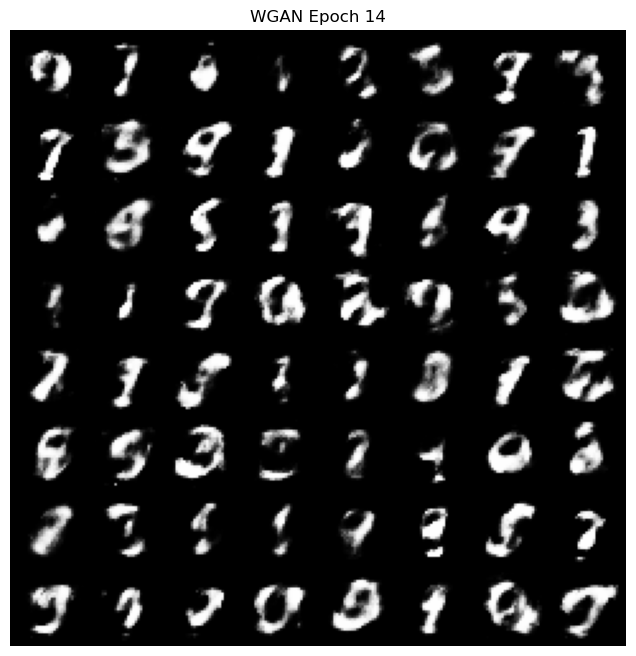

[Epoch 15] Loss_D: -0.1912  Loss_G: 0.0299


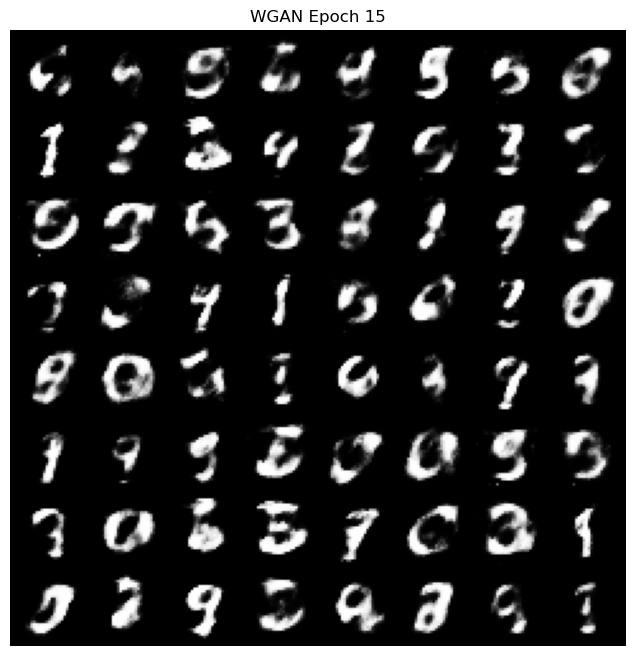

[Epoch 16] Loss_D: -0.1765  Loss_G: 0.0069


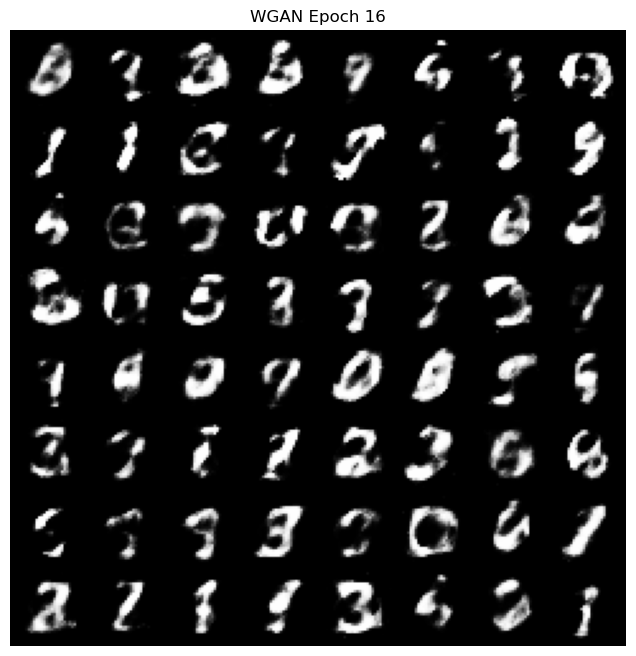

[Epoch 17] Loss_D: -0.1805  Loss_G: 0.0180


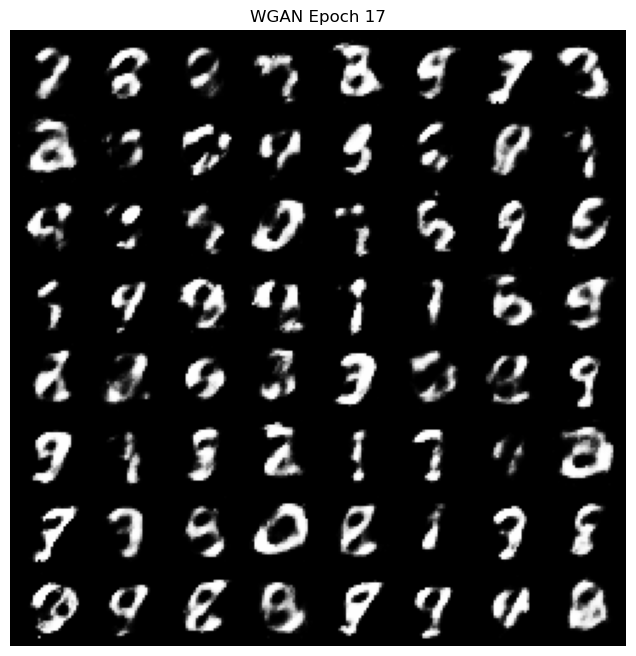

[Epoch 18] Loss_D: -0.1678  Loss_G: -0.0355


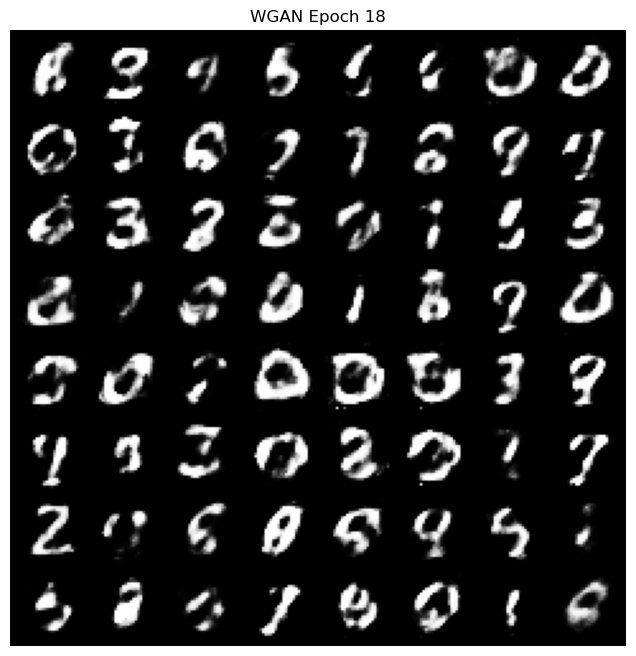

[Epoch 19] Loss_D: -0.1666  Loss_G: 0.0325


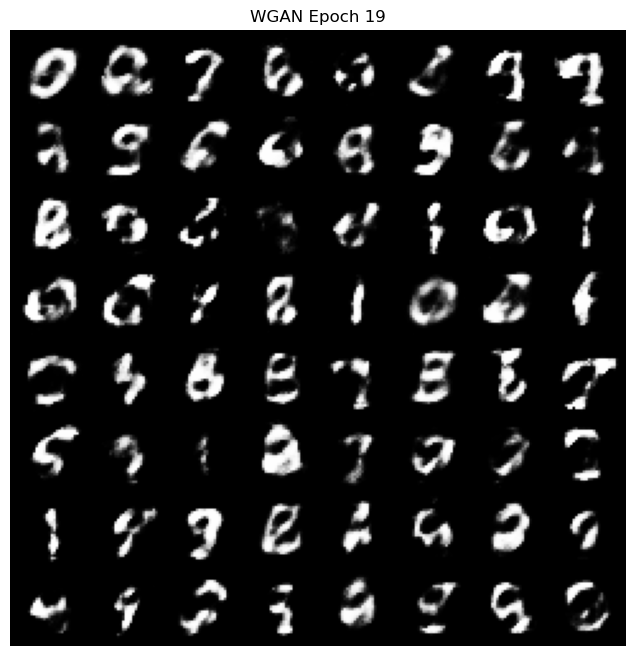

[Epoch 20] Loss_D: -0.1636  Loss_G: -0.0205


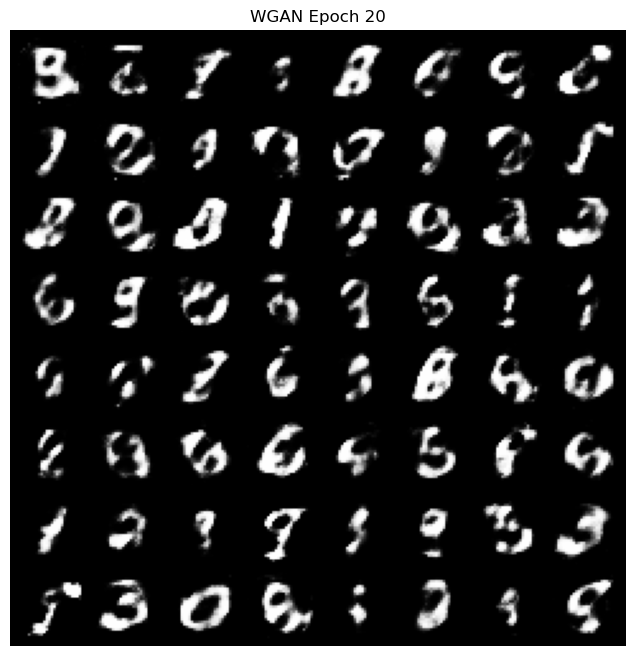

In [89]:
from tqdm import tqdm  # Add this import if not already present

# Initialize WGAN
z_dim = 100
G = WGAN_Generator(z_dim).to(device)
D = WGAN_Discriminator().to(device)
opt_G = optim.RMSprop(G.parameters(), lr=0.00005)
opt_D = optim.RMSprop(D.parameters(), lr=0.00005)

# Training loop with progress bar
n_epochs = 20
n_critic = 5  # Number of critic updates per generator update

for epoch in range(n_epochs):
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}", leave=False)
    for i, (real, _) in enumerate(progress_bar):
        real = real.to(device)
        batch_size = real.size(0)

        # Train Discriminator (Critic) n_critic times
        for _ in range(n_critic):
            noise = torch.randn(batch_size, z_dim, device=device)
            fake = G(noise).detach()
            loss_D = -(D(real).mean() - D(fake).mean())
            opt_D.zero_grad()
            loss_D.backward()
            opt_D.step()

            # Weight clipping (to enforce Lipschitz constraint)
            for p in D.parameters():
                p.data.clamp_(-0.01, 0.01)

        # Train Generator
        noise = torch.randn(batch_size, z_dim, device=device)
        fake = G(noise)
        loss_G = -D(fake).mean()
        opt_G.zero_grad()
        loss_G.backward()
        opt_G.step()

        # Update progress bar
        progress_bar.set_postfix({
            "Loss_D": f"{loss_D.item():.4f}",
            "Loss_G": f"{loss_G.item():.4f}"
        })

    # Log & visualize at epoch end
    print(f"[Epoch {epoch+1}] Loss_D: {loss_D.item():.4f}  Loss_G: {loss_G.item():.4f}")
    with torch.no_grad():
        noise = torch.randn(64, z_dim, device=device)
        fake_imgs = G(noise)
        show_generated_images(fake_imgs, title=f"WGAN Epoch {epoch+1}")


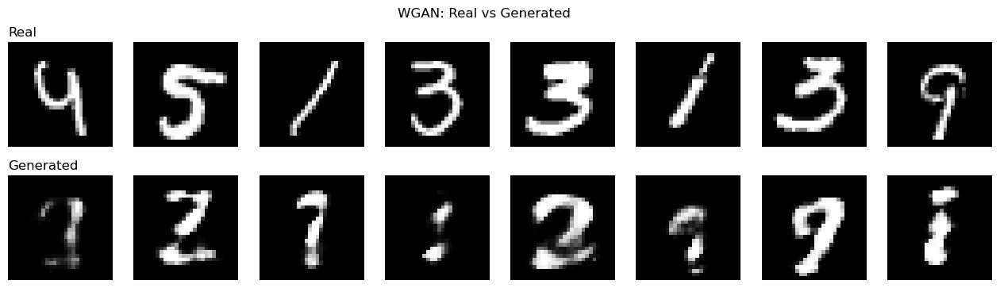

In [90]:
# Plot after training
with torch.no_grad():
    noise = torch.randn(8, z_dim, device=device)
    fake_imgs = G(noise)
    real_imgs = next(iter(dataloader))[0].to(device)
    plot_real_vs_generated(real_imgs, fake_imgs, title="WGAN: Real vs Generated")
